# $$\text{Flight Price Prediction}$$

- The goal is to analyse the dataset and make a model that predicts the fare of a flight ticket for the trip planned with the maximum possible accuracy.

**Limitations:**
- The project has certain limitations
    - Assuming all the external factors remain constant (to what they are when the data is collected)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format='svg'

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Scraped_dataset.csv')
df

,Date of Booking,Date of Journey,Airline-Class,Departure Time,Arrival Time,Duration,Total Stops,Price
0,15/01/2023,16/01/2023,SpiceJet \nSG-8169\nECONOMY,20:00\nDelhi,22:05\nMumbai,02h 05m,non-stop,"5,335"
1,15/01/2023,16/01/2023,Indigo \n6E-2519\nECONOMY,23:00\nDelhi,01:20\nMumbai,02h 20m,non-stop,"5,899"
2,15/01/2023,16/01/2023,GO FIRST \nG8- 354\nECONOMY,22:30\nDelhi,00:40\nMumbai,02h 10m,non-stop,"5,801"
3,15/01/2023,16/01/2023,SpiceJet \nSG-8709\nECONOMY,18:50\nDelhi,20:55\nMumbai,02h 05m,non-stop,"5,794"
4,15/01/2023,16/01/2023,Air India \nAI-805\nECONOMY,20:00\nDelhi,22:10\nMumbai,02h 10m,non-stop,"5,955"
...,...,...,...,...,...,...,...,...
452083,15/01/2023,06/03/2023,Vistara \nUK-926\nBUSINESS,06:45\nAhmedabad,19:50\nChennai,13h 05m,1-stop,"65,028"
452084,15/01/2023,06/03/2023,Vistara \nUK-918\nBUSINESS,05:05\nAhmedabad,16:20\nChennai,11h 15m,1-stop,"69,254"
452085,15/01/2023,06/03/2023,Vistara \nUK-918\nBUSINESS,05:05\nAhmedabad,16:20\nChennai,11h 15m,1-stop,"69,254"
452086,15/01/2023,06/03/2023,Vistara \nUK-946\nBUSINESS,08:40\nAhmedabad,19:50\nChennai,11h 10m,1-stop,"72,980"


# Data Cleaning 

In [3]:
df.isnull().sum()

Date of Booking    0
Date of Journey    0
Airline-Class      0
Departure Time     0
Arrival Time       0
Duration           0
Total Stops        0
Price              0
dtype: int64

In [4]:
df.describe()

,Date of Booking,Date of Journey,Airline-Class,Departure Time,Arrival Time,Duration,Total Stops,Price
count,452088,452088,452088,452088,452088,452088,452088,452088
unique,1,50,1836,1011,1050,482,13,20781
top,15/01/2023,31/01/2023,Vistara \nUK-918\nECONOMY,20:30\nHyderabad,19:50\nChennai,02h 15m,1-stop,"54,879"
freq,452088,9824,2270,5772,5069,4989,366989,2702


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   Date of Booking  452088 non-null  object
 1   Date of Journey  452088 non-null  object
 2   Airline-Class    452088 non-null  object
 3   Departure Time   452088 non-null  object
 4   Arrival Time     452088 non-null  object
 5   Duration         452088 non-null  object
 6   Total Stops      452088 non-null  object
 7   Price            452088 non-null  object
dtypes: object(8)
memory usage: 27.6+ MB


#### Convert Price from Object dtype to int dtype 

In [6]:
fare = list(df['Price'])
for i,v in enumerate(fare):
    if ',' in v:
        f = v.split(',')
        f = ''.join(f)
        del fare[i]
        fare.insert(i,int(f))
    else:
        continue
        
df['Fare'] = fare

In [7]:
df.drop('Price', axis=1, inplace=True)
df['Fare'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 452088 entries, 0 to 452087
Series name: Fare
Non-Null Count   Dtype
--------------   -----
452088 non-null  int64
dtypes: int64(1)
memory usage: 3.4 MB


#### Cleaning Total stops

In [8]:
df['Total Stops'].unique()

array(['non-stop', '1-stop', '2+-stop',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia Indore',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia IDR',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia DIB',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia Guwahati',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia VTZ',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia RPR',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia Mumbai',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia Delhi',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia Pune',
       '1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia PNQ'], dtype=object)

In [9]:
#convert the Total Stops feature a standard format
stops = list(df['Total Stops'])
for i,val in enumerate(stops):
    if '\n' in val:
        cleaned = val.split('\n')[0]
        del stops[i]
        stops.insert(i, cleaned)
    else:
        continue
        
df['Total_stops'] = stops

In [10]:
df['Total_stops'].unique()
df.drop('Total Stops', axis=1, inplace=True)

#### Changing datetime dtype

In [11]:
df['Date_of_booking'] = pd.to_datetime(df['Date of Booking'], dayfirst=True)
df['Date_of_journey'] = pd.to_datetime(df['Date of Journey'], dayfirst=True)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 10 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   Date of Booking  452088 non-null  object        
 1   Date of Journey  452088 non-null  object        
 2   Airline-Class    452088 non-null  object        
 3   Departure Time   452088 non-null  object        
 4   Arrival Time     452088 non-null  object        
 5   Duration         452088 non-null  object        
 6   Fare             452088 non-null  int64         
 7   Total_stops      452088 non-null  object        
 8   Date_of_booking  452088 non-null  datetime64[ns]
 9   Date_of_journey  452088 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(7)
memory usage: 34.5+ MB


#### Airline-Class

In [13]:
Airline = []
Flight_Code = []
Class = []

for i,v in enumerate(df['Airline-Class']):
    breakdown = v.split('\n')
    Airline.append(breakdown[0].strip())
    Flight_Code.append(breakdown[1])
    Class.append(breakdown[2])

In [14]:
print(np.unique(Airline))

print(np.unique(Class))

['Air India' 'AirAsia' 'AkasaAir' 'AllianceAir' 'GO FIRST' 'Indigo'
 'SpiceJet' 'StarAir' 'Vistara']
['BUSINESS' 'ECONOMY' 'FIRST' 'PREMIUMECONOMY']


In [15]:
df['Airline'] = Airline
df['Flight_code'] = Flight_Code
df['Class'] = Class

df['Class'].replace({'PREMIUMECONOMY':'PREMIUM ECONOMY'}, inplace=True)

df['Class'] = df['Class'].str.title()

df['Class'].unique()  

array(['Economy', 'Premium Economy', 'Business', 'First'], dtype=object)

In [16]:
df.drop('Airline-Class', axis=1, inplace=True)
df

,Date of Booking,Date of Journey,Departure Time,Arrival Time,Duration,Fare,Total_stops,Date_of_booking,Date_of_journey,Airline,Flight_code,Class
0,15/01/2023,16/01/2023,20:00\nDelhi,22:05\nMumbai,02h 05m,5335,non-stop,2023-01-15,2023-01-16,SpiceJet,SG-8169,Economy
1,15/01/2023,16/01/2023,23:00\nDelhi,01:20\nMumbai,02h 20m,5899,non-stop,2023-01-15,2023-01-16,Indigo,6E-2519,Economy
2,15/01/2023,16/01/2023,22:30\nDelhi,00:40\nMumbai,02h 10m,5801,non-stop,2023-01-15,2023-01-16,GO FIRST,G8- 354,Economy
3,15/01/2023,16/01/2023,18:50\nDelhi,20:55\nMumbai,02h 05m,5794,non-stop,2023-01-15,2023-01-16,SpiceJet,SG-8709,Economy
4,15/01/2023,16/01/2023,20:00\nDelhi,22:10\nMumbai,02h 10m,5955,non-stop,2023-01-15,2023-01-16,Air India,AI-805,Economy
...,...,...,...,...,...,...,...,...,...,...,...,...
452083,15/01/2023,06/03/2023,06:45\nAhmedabad,19:50\nChennai,13h 05m,65028,1-stop,2023-01-15,2023-03-06,Vistara,UK-926,Business
452084,15/01/2023,06/03/2023,05:05\nAhmedabad,16:20\nChennai,11h 15m,69254,1-stop,2023-01-15,2023-03-06,Vistara,UK-918,Business
452085,15/01/2023,06/03/2023,05:05\nAhmedabad,16:20\nChennai,11h 15m,69254,1-stop,2023-01-15,2023-03-06,Vistara,UK-918,Business
452086,15/01/2023,06/03/2023,08:40\nAhmedabad,19:50\nChennai,11h 10m,72980,1-stop,2023-01-15,2023-03-06,Vistara,UK-946,Business


#### Departure time 

In [17]:
Departure = []
Source = []

for i,v in enumerate(df['Departure Time']):
    breakdown = v.split('\n')
    Departure.append(breakdown[0])
    Source.append(breakdown[1])

In [18]:
df['Source'] = Source
df['Departure'] = Departure
df.drop('Departure Time', axis=1, inplace=True)

#### Arrival Time

In [19]:
Arrival = []
Destination = []

for i,v in enumerate(df['Arrival Time']):
    breakdown = v.split('\n')
    Arrival.append(breakdown[0])
    Destination.append(breakdown[1])

In [20]:
np.unique(Destination)

array(['Ahmedabad', 'Bangalore', 'Chennai', 'Delhi', 'Hyderabad',
       'Kolkata', 'Mumbai'], dtype='<U9')

In [21]:
df['Arrival'] = Arrival
df['Destination'] = Destination
df.drop('Arrival Time', axis=1, inplace=True)

#### Duration 

In [22]:
Duration = []
for time in df['Duration']:
    duration = time.split(' ')
    hours = int(''.join(duration[0].split('h')))
    minutes = int((''.join(duration[1].split('m'))))/60
    
    total_time = round(hours+minutes, 4)
    Duration.append(total_time)

In [23]:
df['Duration_in_hours'] = Duration
df.drop('Duration', axis=1, inplace=True)

#### Journey Day 

In [24]:
df['Journey_day'] = df['Date_of_journey'].dt.day_name()

#### Arrival and Departure Time 

In [25]:
hrs_dep = []
for i in df['Departure']:
    split = int(i.split(':')[0])
    hrs_dep.append(split)
    
categories = ['Before 6 AM','6 AM - 12 PM','12 PM - 6 PM','After 6 PM']
bins = [-1, 5,11,17,23]
    #since the values in bins should increase monotonically we used -1 to start that interval from 0
    #0-5,6-11,12-17,18-23
t_dep = pd.cut(hrs_dep, bins, labels=categories)

hrs_arr = []

for i in df['Arrival']:
    split = int(i.split(':')[0])
    hrs_arr.append(split)
    
categories = ['Before 6 AM','6 AM - 12 PM','12 PM - 6 PM','After 6 PM']
bins = [-1, 5,11,17,23]
t_arr = pd.cut(hrs_arr, bins, labels=categories)

In [26]:
df['Departure'] = t_dep
df['Arrival'] = t_arr
display(df['Departure'].value_counts())
display(df['Arrival'].value_counts())

6 AM - 12 PM    184980
After 6 PM      127969
12 PM - 6 PM    115774
Before 6 AM      23365
Name: Departure, dtype: int64

After 6 PM      200266
6 AM - 12 PM    119644
12 PM - 6 PM    101413
Before 6 AM      30765
Name: Arrival, dtype: int64

#### Days Left 

In [27]:
days = []
for i in (df['Date_of_journey']-df['Date_of_booking']):
    day = str(i).split(' ')[0]
    days.append(int(day))
    
df['Days_left'] = days

In [28]:
df.drop('Date_of_booking', axis=1, inplace=True)

In [29]:
##re-ordering

In [30]:
df = df[['Date_of_journey', 'Journey_day', 'Airline', 'Flight_code', 'Class', 'Source', \
         'Departure','Total_stops', 'Arrival', 'Destination', 'Duration_in_hours','Days_left', 'Fare']]
df.head(3)

,Date_of_journey,Journey_day,Airline,Flight_code,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare
0,2023-01-16,Monday,SpiceJet,SG-8169,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5335
1,2023-01-16,Monday,Indigo,6E-2519,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.3333,1,5899
2,2023-01-16,Monday,GO FIRST,G8- 354,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.1667,1,5801


In [31]:
df.nunique()

Date_of_journey         50
Journey_day              7
Airline                  9
Flight_code           1405
Class                    4
Source                   7
Departure                4
Total_stops              3
Arrival                  4
Destination              7
Duration_in_hours      482
Days_left               50
Fare                 20781
dtype: int64

In [32]:
df_main = df.copy()

In [33]:
from collections import Counter
Counter(df['Source'])

Counter({'Delhi': 83153,
         'Mumbai': 80723,
         'Bangalore': 73375,
         'Hyderabad': 56657,
         'Kolkata': 55560,
         'Chennai': 56514,
         'Ahmedabad': 46106})

In [34]:
df.shape

(452088, 13)

- The dataset contains 13 features with 452088 records

In [35]:
df.describe()

,Duration_in_hours,Days_left,Fare
count,452088.000000,452088.000000,452088.000000
mean,12.349222,25.627902,22840.100890
std,7.431478,14.300846,20307.963002
min,0.750000,1.000000,1307.000000
25%,6.583300,13.000000,8762.750000
50%,11.333300,26.000000,13407.000000
75%,16.500000,38.000000,35587.000000
max,43.583300,50.000000,143019.000000


- The average duration of a journey is 12.34hrs with a standard deviation of 7.43hrs, which shows that there are journeys with a very short duration(min=0.75hrs) and long duration(max= 43.58hrs)
- On an average people purchsed tickets 25.6 days before the journey having the min of 1 day and the maximum of 50 days
- The max fare being 143019 shows there are very expensive tickets (might be depending on the duration or the class we analyse it further) and the min fare recorded was 1307, which is quite cheap and have an average fair of 22,840.10, with standard deviation of 20,307.96

<Axes: >

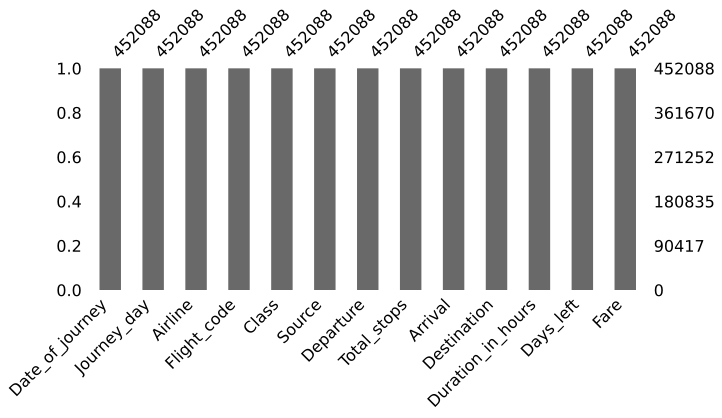

In [36]:
import missingno
missingno.bar(df, figsize=(10,4))

- we dont have any null values in any of the features in the data 

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Date_of_journey    452088 non-null  datetime64[ns]
 1   Journey_day        452088 non-null  object        
 2   Airline            452088 non-null  object        
 3   Flight_code        452088 non-null  object        
 4   Class              452088 non-null  object        
 5   Source             452088 non-null  object        
 6   Departure          452088 non-null  category      
 7   Total_stops        452088 non-null  object        
 8   Arrival            452088 non-null  category      
 9   Destination        452088 non-null  object        
 10  Duration_in_hours  452088 non-null  float64       
 11  Days_left          452088 non-null  int64         
 12  Fare               452088 non-null  int64         
dtypes: category(2), datetime64[ns](1), float64(1

In [38]:
df['Date_of_journey'] = df['Date_of_journey'].astype('object')
df['Departure'] = df['Departure'].astype('object')
df['Arrival'] = df['Arrival'].astype('object')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Date_of_journey    452088 non-null  object 
 1   Journey_day        452088 non-null  object 
 2   Airline            452088 non-null  object 
 3   Flight_code        452088 non-null  object 
 4   Class              452088 non-null  object 
 5   Source             452088 non-null  object 
 6   Departure          452088 non-null  object 
 7   Total_stops        452088 non-null  object 
 8   Arrival            452088 non-null  object 
 9   Destination        452088 non-null  object 
 10  Duration_in_hours  452088 non-null  float64
 11  Days_left          452088 non-null  int64  
 12  Fare               452088 non-null  int64  
dtypes: float64(1), int64(2), object(10)
memory usage: 44.8+ MB


In [39]:
categorical = [feature for feature in df.columns if df[feature].dtypes == 'object']
numerical = [feature for feature in df.columns if df[feature].dtypes != 'object']

print('Categorical features:', categorical, '\n\nNumerical features:', numerical)

Categorical features: ['Date_of_journey', 'Journey_day', 'Airline', 'Flight_code', 'Class', 'Source', 'Departure', 'Total_stops', 'Arrival', 'Destination'] 

Numerical features: ['Duration_in_hours', 'Days_left', 'Fare']


In [40]:
df['Date_of_journey'] = pd.to_datetime(df['Date_of_journey'])

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Date_of_journey    452088 non-null  datetime64[ns]
 1   Journey_day        452088 non-null  object        
 2   Airline            452088 non-null  object        
 3   Flight_code        452088 non-null  object        
 4   Class              452088 non-null  object        
 5   Source             452088 non-null  object        
 6   Departure          452088 non-null  object        
 7   Total_stops        452088 non-null  object        
 8   Arrival            452088 non-null  object        
 9   Destination        452088 non-null  object        
 10  Duration_in_hours  452088 non-null  float64       
 11  Days_left          452088 non-null  int64         
 12  Fare               452088 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), 

In [42]:
for i in categorical:
    uniq = df[i].unique()
    print(uniq, '- Count of unique:',len(uniq))

['2023-01-16T00:00:00.000000000' '2023-01-17T00:00:00.000000000'
 '2023-01-18T00:00:00.000000000' '2023-01-19T00:00:00.000000000'
 '2023-01-20T00:00:00.000000000' '2023-01-21T00:00:00.000000000'
 '2023-01-22T00:00:00.000000000' '2023-01-23T00:00:00.000000000'
 '2023-01-24T00:00:00.000000000' '2023-01-25T00:00:00.000000000'
 '2023-01-26T00:00:00.000000000' '2023-01-27T00:00:00.000000000'
 '2023-01-28T00:00:00.000000000' '2023-01-29T00:00:00.000000000'
 '2023-01-30T00:00:00.000000000' '2023-01-31T00:00:00.000000000'
 '2023-02-01T00:00:00.000000000' '2023-02-02T00:00:00.000000000'
 '2023-02-03T00:00:00.000000000' '2023-02-04T00:00:00.000000000'
 '2023-02-05T00:00:00.000000000' '2023-02-06T00:00:00.000000000'
 '2023-02-07T00:00:00.000000000' '2023-02-08T00:00:00.000000000'
 '2023-02-09T00:00:00.000000000' '2023-02-10T00:00:00.000000000'
 '2023-02-11T00:00:00.000000000' '2023-02-12T00:00:00.000000000'
 '2023-02-13T00:00:00.000000000' '2023-02-14T00:00:00.000000000'
 '2023-02-15T00:00:00.000

- The data is recorded for 50 days starting from Jan 16 2023 till Mar 06 2023, and on each day of the week
- We have 9 different airlines having 4 classes, flights taking off from 'Delhi' 'Mumbai' 'Bangalore' 'Hyderabad' 'Kolkata' 'Chennai' 'Ahmedabad'

In [43]:
df.duplicated().sum()

6722

In [44]:
df[df.duplicated()]

,Date_of_journey,Journey_day,Airline,Flight_code,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare
19211,2023-01-16,Monday,Vistara,UK-627,Economy,Delhi,12 PM - 6 PM,2+-stop,After 6 PM,Bangalore,29.9167,1,11117
19321,2023-01-16,Monday,Vistara,UK-627,Premium Economy,Delhi,12 PM - 6 PM,2+-stop,After 6 PM,Bangalore,31.5833,1,20084
19323,2023-01-16,Monday,Vistara,UK-627,Premium Economy,Delhi,12 PM - 6 PM,2+-stop,After 6 PM,Bangalore,33.5000,1,20084
19633,2023-01-17,Tuesday,Vistara,UK-929,Economy,Delhi,After 6 PM,2+-stop,After 6 PM,Bangalore,21.9167,2,15473
19670,2023-01-17,Tuesday,Vistara,UK-627,Premium Economy,Delhi,12 PM - 6 PM,2+-stop,After 6 PM,Bangalore,29.9167,2,15196
...,...,...,...,...,...,...,...,...,...,...,...,...,...
451999,2023-03-06,Monday,Air India,AI-482,Economy,Ahmedabad,12 PM - 6 PM,1-stop,Before 6 AM,Chennai,10.4167,50,11646
452010,2023-03-06,Monday,Vistara,UK-918,Economy,Ahmedabad,Before 6 AM,1-stop,12 PM - 6 PM,Chennai,11.2500,50,15856
452011,2023-03-06,Monday,Vistara,UK-918,Economy,Ahmedabad,Before 6 AM,1-stop,12 PM - 6 PM,Chennai,11.2500,50,15856
452085,2023-03-06,Monday,Vistara,UK-918,Business,Ahmedabad,Before 6 AM,1-stop,12 PM - 6 PM,Chennai,11.2500,50,69254


In [45]:
df.drop_duplicates(ignore_index=True, inplace=True)

In [46]:
df.groupby('Journey_day')['Fare'].mean()

Journey_day
Friday       22734.157420
Monday       23200.168582
Saturday     23049.536544
Sunday       23140.970283
Thursday     22306.657631
Tuesday      22744.700652
Wednesday    23235.865339
Name: Fare, dtype: float64

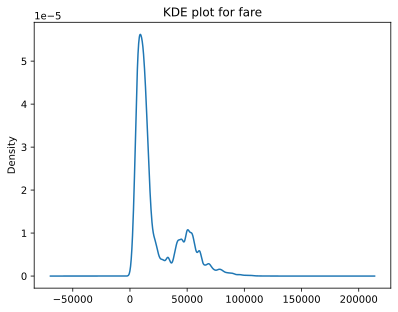

In [47]:
df['Fare'].plot(kind='kde')
plt.title('KDE plot for fare')
plt.show()

In [48]:
import matplotlib.pyplot as plt

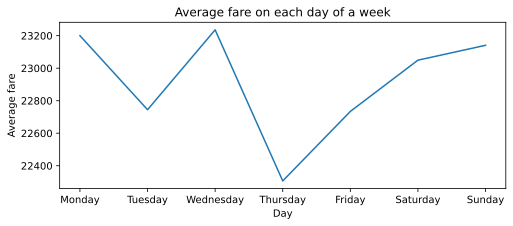

In [49]:
day_fare = pd.DataFrame(df.groupby('Journey_day')['Fare'].mean()).reset_index()

#for custom order
day_order = ['Monday','Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_fare['Journey_day'] = pd.Categorical(day_fare['Journey_day'], day_order)

#after the baove line of the the output remains same as above but to apply that we need to sort
day_fare.sort_values('Journey_day', inplace=True)

plt.figure(figsize=(8,3))
plt.plot(day_fare['Journey_day'], day_fare['Fare'])
plt.title('Average fare on each day of a week')
plt.xlabel('Day')
plt.ylabel('Average fare')
plt.show()

- On Thursday, the prices are a bit cheap (not much difference though) and Wednesday is expensive

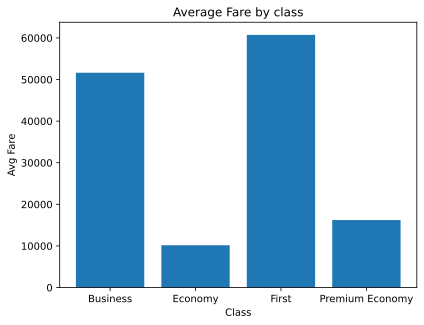

In [50]:
#group by the class and find the average fare then convert to a proper dataframe
avg_fare = pd.DataFrame(df.groupby('Class')['Fare'].mean().reset_index())

#plotting
plt.bar(avg_fare['Class'], avg_fare['Fare'])
plt.xlabel('Class')
plt.ylabel('Avg Fare')
plt.title('Average Fare by class')
plt.show()

- The price is hugely dependent on the class, First class is expensive among the four classes, followed by business, premium economy and economy

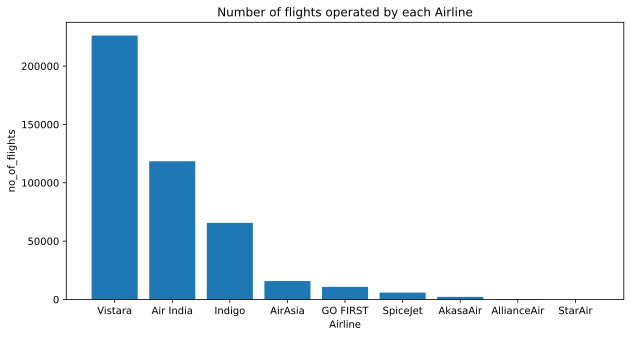

In [51]:
#value_counts on airline, to find the number of records for each airline
no_flights = pd.DataFrame(df['Airline'].value_counts().reset_index())
no_flights.columns = ['Airline', 'no_of_flights'] #renaming the columns as per the requirement

#plotting
plt.figure(figsize=(10,5))
plt.bar(no_flights['Airline'], no_flights['no_of_flights'])
plt.xlabel('Airline')
plt.ylabel('no_of_flights')
plt.title('Number of flights operated by each Airline')

plt.show()

In [52]:
#average fare by airline
df.groupby('Airline')['Fare'].mean()

Airline
Air India      27082.469364
AirAsia         7092.265922
AkasaAir        3570.034529
AllianceAir     4077.501272
GO FIRST        8015.075005
Indigo          8198.754809
SpiceJet        8109.773154
StarAir         9792.774194
Vistara        27438.430899
Name: Fare, dtype: float64

- The average fair of Vistara and Air India are are most equal but high compared to other airlines and the least is with AkasaAir - may be Vistara and Air India has many seats availability for Business and First class

In [53]:
airline_class = pd.DataFrame(df.groupby('Airline')['Class'].value_counts())
airline_class.columns = ['appearences']
airline_class.reset_index(inplace=True)
#airline_class.set_index('Airline')
airline_class

,Airline,Class,appearences
0,Air India,Economy,66005
1,Air India,Business,52256
2,Air India,First,144
3,AirAsia,Economy,15764
4,AkasaAir,Economy,2230
5,AllianceAir,Economy,393
6,GO FIRST,Economy,10786
7,Indigo,Economy,65659
8,SpiceJet,Economy,5863
9,StarAir,Economy,62


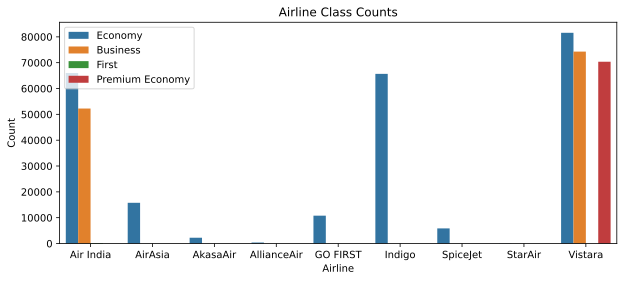

In [54]:
# create a bar plot of airline class counts for each airline
plt.figure(figsize=(10, 4))
sns.barplot(data=airline_class, x='Airline', y='appearences', hue='Class')
plt.xlabel('Airline')
plt.ylabel('Count')
plt.title('Airline Class Counts')
plt.legend(loc=0)
plt.show()


- As we can see, its only Air India and Vistara provide higher classes, rest of the airlines have only Economy class
- Vistara has a great figures, for all the 3 classes it provides, it tops the list.
- Another takeaway point is that Vistara runs flights more actively than any other airlines followed by air indigo and air asia

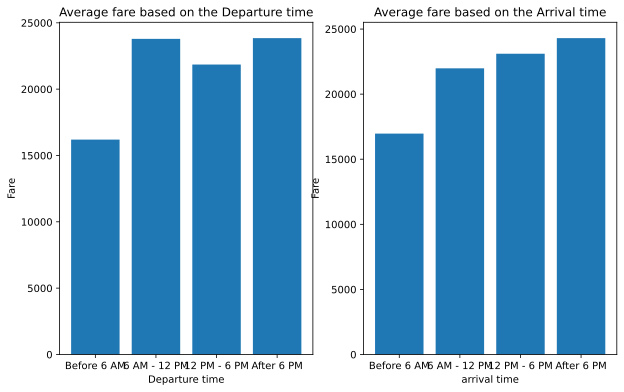

In [55]:
#fare based on the departure time
deptime_fare = pd.DataFrame(df.groupby('Departure')['Fare'].mean()).reset_index()

#change the order existing to the custom order
order = ['Before 6 AM', '6 AM - 12 PM', '12 PM - 6 PM', 'After 6 PM']
deptime_fare['Departure'] = pd.Categorical(deptime_fare['Departure'], order)
deptime_fare.sort_values('Departure', inplace=True)

plt.figure(figsize=(10,6))

#plotting
plt.subplot(1,2,1)
plt.bar(deptime_fare['Departure'], deptime_fare['Fare'])
plt.title('Average fare based on the Departure time')
plt.xlabel('Departure time')
plt.ylabel('Fare')

#fare based on the arrival time
arrival_fare = pd.DataFrame(df.groupby('Arrival')['Fare'].mean()).reset_index()

#change the order existing to the custom order
arrival_fare['Arrival'] = pd.Categorical(arrival_fare['Arrival'], order)
arrival_fare.sort_values('Arrival', inplace=True)

#plotting
plt.subplot(1,2,2)
plt.bar(arrival_fare['Arrival'], arrival_fare['Fare'])
plt.title('Average fare based on the Arrival time')
plt.xlabel('arrival time')
plt.ylabel('Fare')

plt.show()

- The price is least for the flight departing Early in the morning (before 6AM) or arriving before 6pm

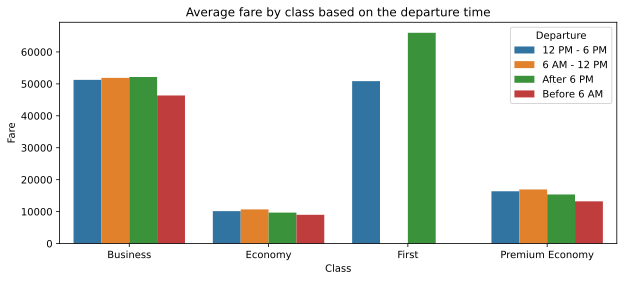

In [56]:
data = pd.DataFrame(df.groupby(['Class', 'Departure'])['Fare'].mean().reset_index())

plt.figure(figsize=(10,4))
sns.barplot(data = data, x = 'Class', y='Fare', hue='Departure')
plt.title('Average fare by class based on the departure time')
plt.show()

- So whatever the class might be, if the departing time is before 6AM, then we can get the ticket for the best price, the reasons might be many like, to reduce the flow during the day-time by giving a discounted price etc.,

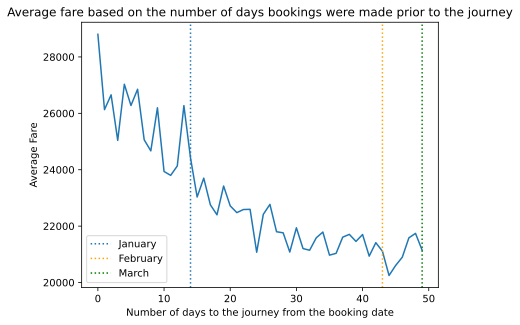

In [57]:
date_fare = pd.DataFrame(df.groupby('Date_of_journey')['Fare'].mean()).reset_index()
plt.plot(date_fare['Fare'])
plt.axvline(x=14, linestyle=':', label='January')#we took theses numbers from the data_fare df
plt.axvline(x=43, linestyle=':', color='orange', label='February')
plt.axvline(x=49, linestyle=':', color='green', label='March')

plt.title('Average fare based on the number of days bookings were made prior to the journey')
plt.xlabel('Number of days to the journey from the booking date')
plt.ylabel('Average Fare')

plt.legend()

plt.show()

,Journey,Fare
21,Delhi To Hyderabad,19126.215396
24,Hyderabad To Ahmedabad,19247.707620
18,Delhi To Ahmedabad,19324.498521
8,Bangalore To Delhi,19631.557117
2,Ahmedabad To Delhi,19644.625549
23,Delhi To Mumbai,19741.550254
39,Mumbai To Delhi,19766.967205
19,Delhi To Bangalore,19884.506740
3,Ahmedabad To Hyderabad,20477.059210
0,Ahmedabad To Bangalore,20800.701004


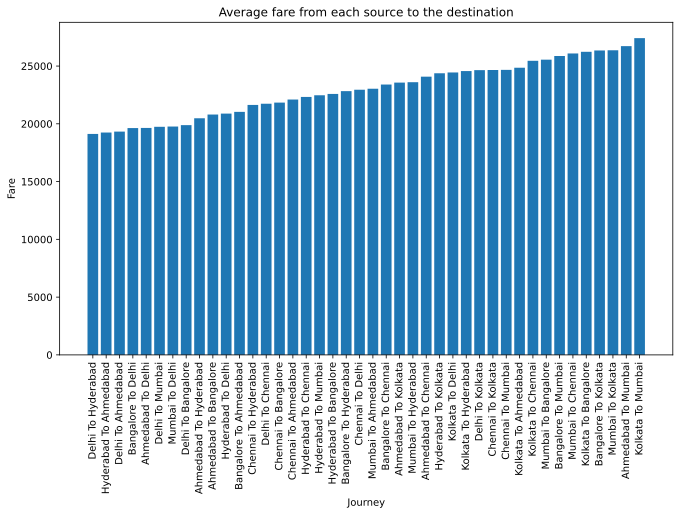

In [58]:
#check the fare by origin and arrival city
source_destination = pd.DataFrame(df.groupby(['Source','Destination'])['Fare'].mean()).reset_index()

#merge the source and destination into a new column to make it even more clear
source_destination['Journey'] = source_destination['Source']+ ' To ' +source_destination['Destination']
source_destination.drop(['Source', 'Destination'], axis=1, inplace=True)
source_destination.sort_values(by='Fare', inplace=True)

#reorder the columns
source_destination = source_destination[['Journey','Fare']]
display(source_destination)

#plotting
plt.figure(figsize=(11,6))
plt.bar(source_destination['Journey'], source_destination['Fare'])
plt.xlabel('Journey')
plt.ylabel('Fare')
plt.title('Average fare from each source to the destination')
plt.xticks(rotation=90)

plt.show()

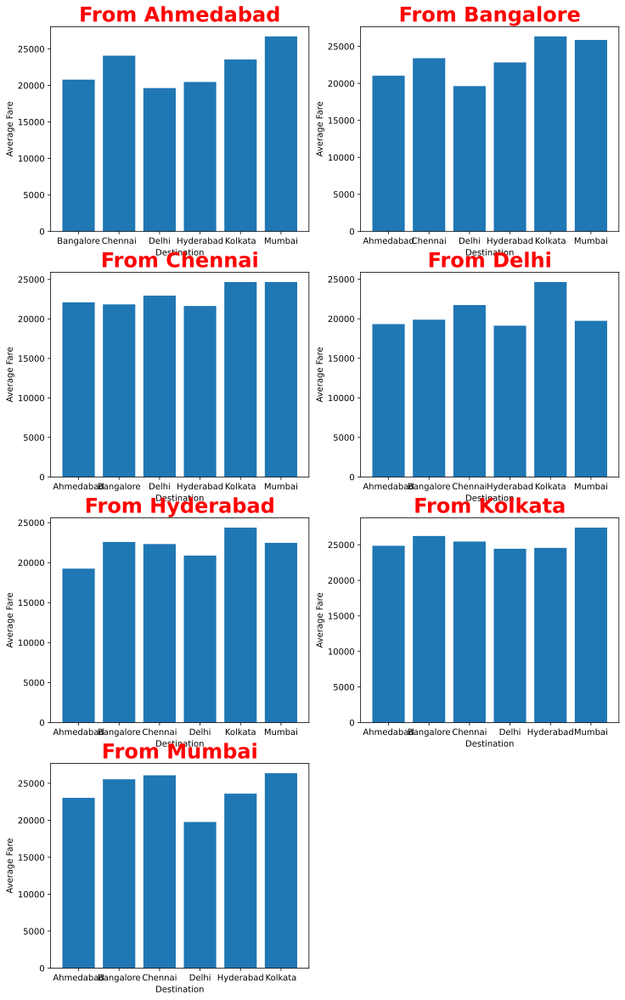

In [59]:
route_avg_fare = pd.DataFrame(df.groupby(['Source', 'Destination'])['Fare'].mean())
route_avg_fare.reset_index(inplace=True)

plt.figure(figsize=(12,20))

#plot avegare for from each origin to each destination
j=1
cities = ['Ahmedabad', 'Bangalore', 'Chennai', 'Delhi', 'Hyderabad', 'Kolkata', 'Mumbai']
for i in cities:
    i_info = route_avg_fare[route_avg_fare['Source']==i]
    
    if j<8:
        plt.subplot(4,2,j)
        plt.bar(i_info['Destination'], i_info['Fare'])
        plt.xlabel('Destination')
        plt.ylabel('Average Fare')
        
        plt.title('From '+i, fontdict = {'fontsize':24,'fontweight':'bold', 'color':'red'})
    
    j+=1

plt.show()

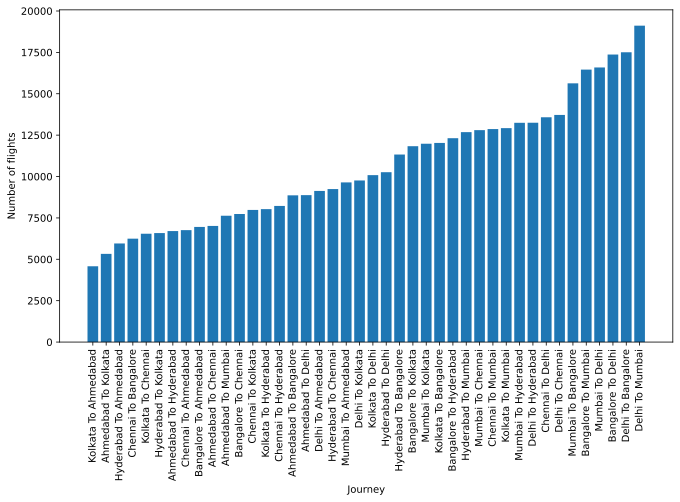

In [60]:
#number of flights available in a route
no_flights = pd.DataFrame(df.groupby(['Source','Destination']).size()).reset_index()
no_flights.rename({0:'Flights'}, axis=1, inplace=True)
no_flights['Journey'] = no_flights['Source'] + ' To ' + no_flights['Destination']
no_flights = no_flights[['Journey','Flights']]
no_flights.sort_values(by='Flights', inplace=True)

plt.figure(figsize=(11,6))
plt.bar(no_flights['Journey'], no_flights['Flights'])
plt.xlabel('Journey')
plt.ylabel('Number of flights')
plt.xticks(rotation=90)
plt.show()

- The maximum number of flights are available from Delhi to Mumbai followed by Delhi to Banglore
- The least is from Kolkata to Ahmedabad

In [61]:
#now we will find the on each day of a week which route has max fare

max_price_days = pd.DataFrame(df.groupby(['Journey_day', 'Source', 'Destination'])['Fare'].mean())
max_price_days.reset_index(inplace=True)
days = ['Monday','Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

#create an empty df to concat the records we extract based on the fare(max)
days_expensive_route = pd.DataFrame()
for i in days:
    max_fare = max_price_days[max_price_days['Journey_day']==i]['Fare'].max()
    days_expensive_route = pd.concat([days_expensive_route,
                            max_price_days[max_price_days['Fare']==max_fare]])#default axis=0
    
days_expensive_route.reset_index(inplace=True, drop=True)
days_expensive_route

,Journey_day,Source,Destination,Fare
0,Monday,Ahmedabad,Mumbai,28574.164735
1,Tuesday,Kolkata,Ahmedabad,27602.439607
2,Wednesday,Ahmedabad,Mumbai,29577.635359
3,Thursday,Mumbai,Kolkata,28466.744792
4,Friday,Kolkata,Mumbai,28519.179070
5,Saturday,Ahmedabad,Kolkata,28678.170047
6,Sunday,Kolkata,Chennai,29488.995833


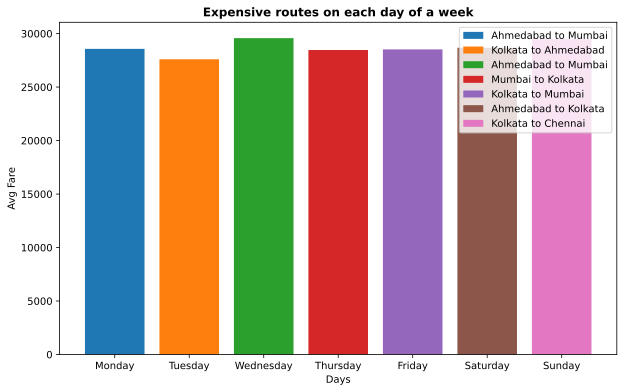

In [62]:
#visualize the above data in a bar plot
plt.figure(figsize=(10,6))
for i in days_expensive_route['Journey_day']:
    source_i = str(days_expensive_route[days_expensive_route['Journey_day']==i][['Source']]).split()[2]
    destination_i = str(days_expensive_route[days_expensive_route['Journey_day']==i][['Destination']]).split()[2]
    route = source_i+' to '+destination_i
    plt.bar(i, days_expensive_route[days_expensive_route['Journey_day']==i]['Fare'], 
           label = route)
    
plt.xlabel('Days')
plt.ylabel('Avg Fare')
plt.title('Expensive routes on each day of a week', fontdict = {'fontweight':'bold'})
plt.legend()
plt.show()

- The above plot shows the expensive route on each day of the week
- On both Monday and Wednesday Ahmedabad to Mumbai route is expensive

In [63]:
min_price_days = pd.DataFrame(df.groupby(['Journey_day', 'Source', 'Destination'])['Fare'].mean())
min_price_days.reset_index(inplace=True)

days_cheap_route = pd.DataFrame()

for i in days:
    min_fare = min_price_days[min_price_days['Journey_day']==i]['Fare'].min()
    days_cheap_route = pd.concat([days_cheap_route,min_price_days[min_price_days['Fare']==min_fare]])

days_cheap_route.reset_index(inplace=True, drop=True)
days_cheap_route

,Journey_day,Source,Destination,Fare
0,Monday,Hyderabad,Ahmedabad,17484.297092
1,Tuesday,Hyderabad,Ahmedabad,18094.299652
2,Wednesday,Delhi,Hyderabad,19066.676331
3,Thursday,Hyderabad,Ahmedabad,14832.782609
4,Friday,Bangalore,Ahmedabad,16723.125152
5,Saturday,Delhi,Hyderabad,18306.103903
6,Sunday,Delhi,Hyderabad,19259.861622


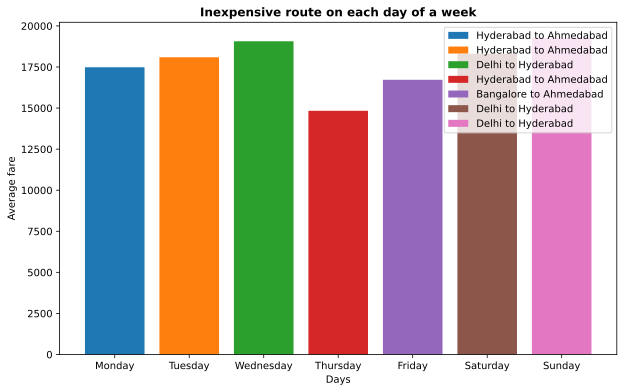

In [64]:
plt.figure(figsize=(10,6))
for i in days_cheap_route['Journey_day']:
    
    source_i = str(days_cheap_route[days_cheap_route['Journey_day']==i][['Source']]).split()[2]
    destination_i = str(days_cheap_route[days_cheap_route['Journey_day']==i][['Destination']]).split()[2]
    route = source_i + ' to ' + destination_i
    
    plt.bar(i,days_cheap_route[days_cheap_route['Journey_day']==i]['Fare'], label = route)
    
plt.xlabel('Days')
plt.ylabel('Average fare')
plt.title('Inexpensive route on each day of a week', fontdict = {'fontweight':'bold'})
plt.legend()
plt.show()

<Figure size 600x400 with 0 Axes>

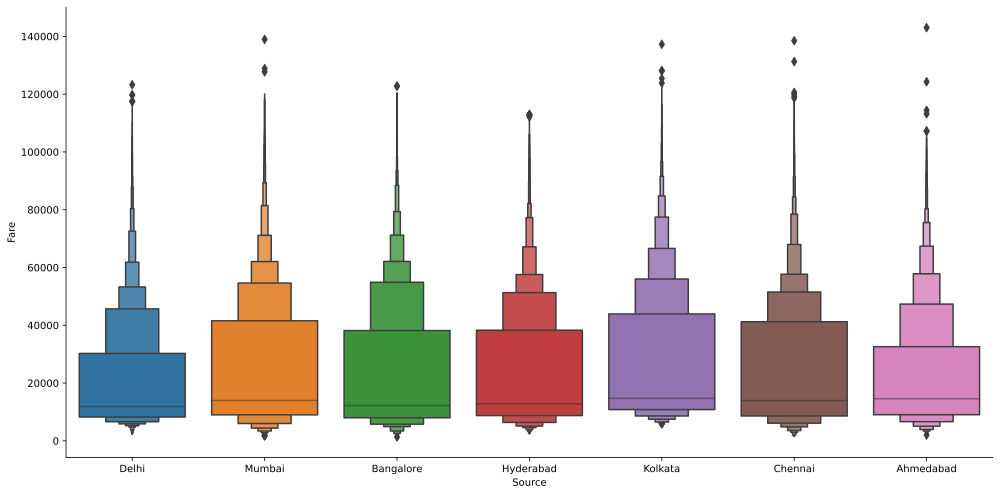

In [65]:
plt.figure(figsize=(6,4))
sns.catplot(data=df, x='Source', y='Fare', kind='boxen', height=7, aspect=2)
plt.show()

<Figure size 600x400 with 0 Axes>

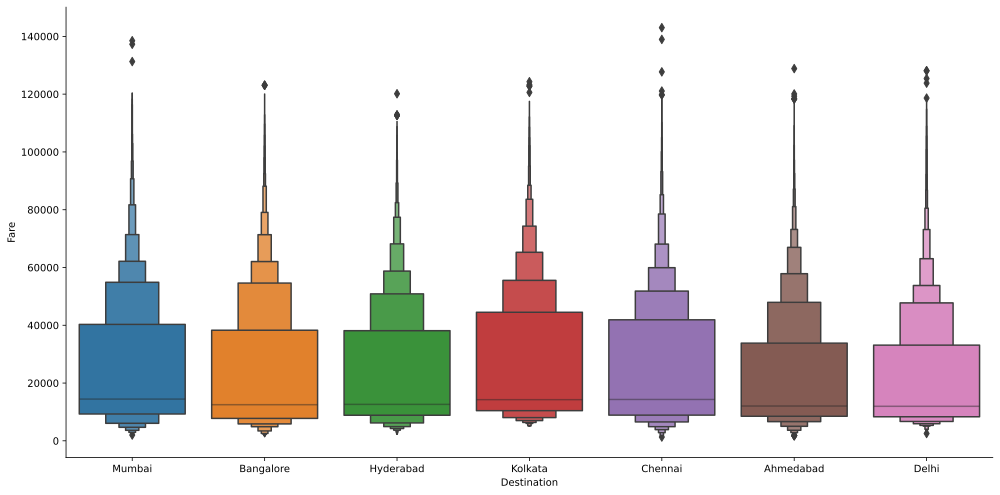

In [66]:
plt.figure(figsize=(6,4))
sns.catplot(data=df, x='Destination', y='Fare', kind='boxen', height=7, aspect=2)
plt.show()

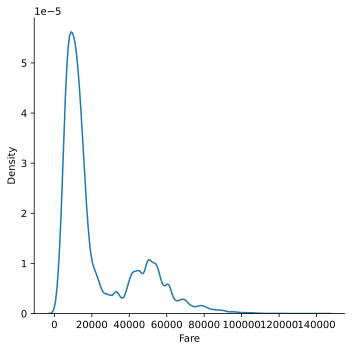

In [67]:
sns.displot(data=df, x='Fare', kind='kde')

In [68]:
Q1 = df['Fare'].quantile(0.25)
Q2 = df['Fare'].quantile(0.50)
Q3 = df['Fare'].quantile(0.75)

lb = Q1 - 1.5*(Q3-Q1)
ub = Q3 + 1.5*(Q3-Q1)
print('lb:', lb, '\nub:', ub)

lb: -33690.0 
ub: 79382.0


In [69]:
from feature_engine.outliers import Winsorizer
win = Winsorizer(capping_method='iqr', tail='both', fold=1.5)
df['Fare'] = win.fit_transform(df[['Fare']])

<Axes: ylabel='Fare'>

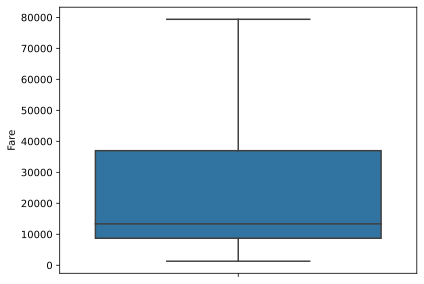

In [70]:
sns.boxplot(y= df['Fare'])

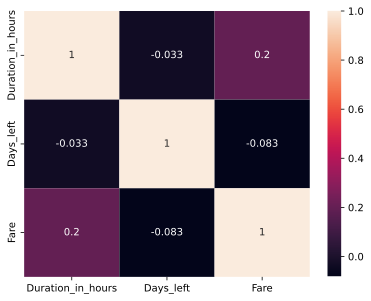

In [71]:
sns.heatmap(df.corr(), annot=True)
plt.show()

### Ordinal and OneHotEncoding 

In [72]:
#since we dont need the date of journey and flight code for modelling we drop those variables
#also Journey_day least corr with the Fare so we drop it
df.drop(['Journey_day','Date_of_journey', 'Flight_code'], axis=1, inplace=True)

In [73]:
df

,Airline,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare
0,SpiceJet,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5335
1,Indigo,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.3333,1,5899
2,GO FIRST,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.1667,1,5801
3,SpiceJet,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5794
4,Air India,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.1667,1,5955
...,...,...,...,...,...,...,...,...,...,...
445361,Vistara,Business,Ahmedabad,Before 6 AM,1-stop,12 PM - 6 PM,Chennai,11.2500,50,61302
445362,Vistara,Business,Ahmedabad,6 AM - 12 PM,1-stop,After 6 PM,Chennai,11.1667,50,65028
445363,Vistara,Business,Ahmedabad,6 AM - 12 PM,1-stop,After 6 PM,Chennai,13.0833,50,65028
445364,Vistara,Business,Ahmedabad,Before 6 AM,1-stop,12 PM - 6 PM,Chennai,11.2500,50,69254


In [74]:
from sklearn.preprocessing import OrdinalEncoder

In [75]:
oe = OrdinalEncoder(categories=[['Economy', 'Premium Economy', 'Business', 'First']])
df['Class'] = oe.fit_transform(df[['Class']])

oe = OrdinalEncoder(categories=[['Before 6 AM', '6 AM - 12 PM','12 PM - 6 PM', 'After 6 PM']])
df['Arrival'] = oe.fit_transform(df[['Arrival']])
df['Departure'] = oe.fit_transform(df[['Departure']])

oe = OrdinalEncoder(categories=[['2+-stop', '1-stop', 'non-stop']])
df['Total_stops'] = oe.fit_transform(df[['Total_stops']])

In [76]:
df

,Airline,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare
0,SpiceJet,0.0,Delhi,3.0,2.0,3.0,Mumbai,2.0833,1,5335
1,Indigo,0.0,Delhi,3.0,2.0,0.0,Mumbai,2.3333,1,5899
2,GO FIRST,0.0,Delhi,3.0,2.0,0.0,Mumbai,2.1667,1,5801
3,SpiceJet,0.0,Delhi,3.0,2.0,3.0,Mumbai,2.0833,1,5794
4,Air India,0.0,Delhi,3.0,2.0,3.0,Mumbai,2.1667,1,5955
...,...,...,...,...,...,...,...,...,...,...
445361,Vistara,2.0,Ahmedabad,0.0,1.0,2.0,Chennai,11.2500,50,61302
445362,Vistara,2.0,Ahmedabad,1.0,1.0,3.0,Chennai,11.1667,50,65028
445363,Vistara,2.0,Ahmedabad,1.0,1.0,3.0,Chennai,13.0833,50,65028
445364,Vistara,2.0,Ahmedabad,0.0,1.0,2.0,Chennai,11.2500,50,69254


In [77]:
from sklearn.preprocessing import OneHotEncoder

In [78]:
df['Airline'].sort_values().unique()

array(['Air India', 'AirAsia', 'AkasaAir', 'AllianceAir', 'GO FIRST',
       'Indigo', 'SpiceJet', 'StarAir', 'Vistara'], dtype=object)

In [79]:
df['Source'].sort_values().unique()

array(['Ahmedabad', 'Bangalore', 'Chennai', 'Delhi', 'Hyderabad',
       'Kolkata', 'Mumbai'], dtype=object)

<Axes: >

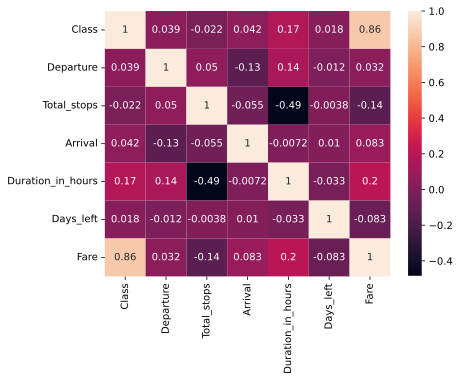

In [80]:
sns.heatmap(df.corr(numeric_only=True), annot=True)

In [81]:
#encoding airlines
ohe = OneHotEncoder(drop = 'first')
airlines_encoded = pd.DataFrame(ohe.fit_transform(df[['Airline']]).toarray(), 
                   columns=['AirAsia', 'AkasaAir', 'AllianceAir', 'GO FIRST',
                            'Indigo', 'SpiceJet', 'StarAir', 'Vistara'])

#encoding_source
source_encoded = pd.DataFrame(ohe.fit_transform(df[['Source']]).toarray(), 
                    columns = ['source_Bangalore', 'source_Chennai', 'source_Delhi', 
                               'source_Hyderabad', 'source_Kolkata', 'source_Mumbai'])

#Encoding destinatination
destination_encoded = pd.DataFrame(ohe.fit_transform(df[['Destination']]).toarray(), 
                    columns = ['destination_Bangalore', 'destination_Chennai', 'destination_Delhi', 
                               'destination_Hyderabad', 'destination_Kolkata', 'destination_Mumbai']) 
    
df = pd.concat([df, airlines_encoded, source_encoded, destination_encoded], axis=1)
df.drop(['Airline', 'Source', 'Destination'], axis=1, inplace=True)
df

,Class,Departure,Total_stops,Arrival,Duration_in_hours,Days_left,Fare,AirAsia,AkasaAir,AllianceAir,...,source_Delhi,source_Hyderabad,source_Kolkata,source_Mumbai,destination_Bangalore,destination_Chennai,destination_Delhi,destination_Hyderabad,destination_Kolkata,destination_Mumbai
0,0.0,3.0,2.0,3.0,2.0833,1,5335,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,3.0,2.0,0.0,2.3333,1,5899,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,3.0,2.0,0.0,2.1667,1,5801,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,3.0,2.0,3.0,2.0833,1,5794,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,3.0,2.0,3.0,2.1667,1,5955,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445361,2.0,0.0,1.0,2.0,11.2500,50,61302,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445362,2.0,1.0,1.0,3.0,11.1667,50,65028,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445363,2.0,1.0,1.0,3.0,13.0833,50,65028,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445364,2.0,0.0,1.0,2.0,11.2500,50,69254,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [82]:
pd.set_option('display.max_columns', 29)

In [83]:
df.head()

,Class,Departure,Total_stops,Arrival,Duration_in_hours,Days_left,Fare,AirAsia,AkasaAir,AllianceAir,GO FIRST,Indigo,SpiceJet,StarAir,Vistara,source_Bangalore,source_Chennai,source_Delhi,source_Hyderabad,source_Kolkata,source_Mumbai,destination_Bangalore,destination_Chennai,destination_Delhi,destination_Hyderabad,destination_Kolkata,destination_Mumbai
0,0.0,3.0,2.0,3.0,2.0833,1,5335,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,3.0,2.0,0.0,2.3333,1,5899,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,3.0,2.0,0.0,2.1667,1,5801,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,3.0,2.0,3.0,2.0833,1,5794,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,3.0,2.0,3.0,2.1667,1,5955,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [84]:
df.columns

Index(['Class', 'Departure', 'Total_stops', 'Arrival', 'Duration_in_hours',
       'Days_left', 'Fare', 'AirAsia', 'AkasaAir', 'AllianceAir', 'GO FIRST',
       'Indigo', 'SpiceJet', 'StarAir', 'Vistara', 'source_Bangalore',
       'source_Chennai', 'source_Delhi', 'source_Hyderabad', 'source_Kolkata',
       'source_Mumbai', 'destination_Bangalore', 'destination_Chennai',
       'destination_Delhi', 'destination_Hyderabad', 'destination_Kolkata',
       'destination_Mumbai'],
      dtype='object')

In [85]:
X = df.drop('Fare', axis=1)
y = df['Fare']

In [86]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9)

model = LinearRegression()
model.fit(X_train, y_train)

model.predict(X_test)

print(model.score(X_train, y_train))
print(model.score(X_test, y_test))
print(cross_val_score(model, X, y, cv=5).mean())

0.7865948876724547
0.7859435315210259
0.7715659607547366


## Linear Regression 

In [87]:
X = df.drop('Fare', axis=1)
y = df['Fare']

In [88]:
X

,Class,Departure,Total_stops,Arrival,Duration_in_hours,Days_left,AirAsia,AkasaAir,AllianceAir,GO FIRST,Indigo,SpiceJet,StarAir,Vistara,source_Bangalore,source_Chennai,source_Delhi,source_Hyderabad,source_Kolkata,source_Mumbai,destination_Bangalore,destination_Chennai,destination_Delhi,destination_Hyderabad,destination_Kolkata,destination_Mumbai
0,0.0,3.0,2.0,3.0,2.0833,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,3.0,2.0,0.0,2.3333,1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,3.0,2.0,0.0,2.1667,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,3.0,2.0,3.0,2.0833,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,3.0,2.0,3.0,2.1667,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445361,2.0,0.0,1.0,2.0,11.2500,50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445362,2.0,1.0,1.0,3.0,11.1667,50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445363,2.0,1.0,1.0,3.0,13.0833,50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445364,2.0,0.0,1.0,2.0,11.2500,50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [89]:
import statsmodels.formula.api as smf
result = smf.ols('y ~X', data=df).fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.786
Method:                 Least Squares   F-statistic:                 6.309e+04
Date:                Mon, 01 May 2023   Prob (F-statistic):               0.00
Time:                        15:27:18   Log-Likelihood:            -4.6975e+06
No. Observations:              445366   AIC:                         9.395e+06
Df Residuals:                  445339   BIC:                         9.395e+06
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.559e+04    106.202    146.817      0.000    1.54e+04    1.58e+04
X[0]        1.983e+04     17.738   1118.031      0.000    1.98e+04    1.99e+04
X[1]         199.3728     15.594     12.785      0.000     168.810     229.936
X[2]       -6069.8617     39.293   -154.477      0.000   -6146.875   -5992.849
X[3]         794.3783     14.279     55.633      0.000     766.392     822.364
X[4]         -69.1233      2.453    -28.180      0.000     -73.931     -64.316
X[5]        -140.6908      0.967   -145.433      0.000    -142.587    -138.795
X[6]       -2799.9272     81.410    -34.393      0.000   -2959.489   -2640.366
X[7]        -390.0861    201.970     -1.931      0.053    -785.942       5.770
X[8]        -794.3939    467.491     -1.699      0.089   -1710.661     121.873
X[9]        -168.6949     95.650     -1.764      0.078    -356.167      18.777
X[10]       -560.3950     52.154    -10.745      0.000    -662.615    -458.175
X[11]         17.0504    125.019      0.136      0.892    -227.982     262.083
X[12]       3326.7542   1171.587      2.840      0.005    1030.479    5623.029
X[13]      -1624.6461     33.382    -48.668      0.000   -1690.074   -1559.218
X[14]        457.9048     56.863      8.053      0.000     346.455     569.355
X[15]        569.1225     59.927      9.497      0.000     451.668     686.577
X[16]      -1617.0139     55.753    -29.003      0.000   -1726.288   -1507.739
X[17]       -313.8059     59.568     -5.268      0.000    -430.558    -197.054
X[18]       4265.3206     59.938     71.162      0.000    4147.843    4382.798
X[19]         59.8569     55.914      1.071      0.284     -49.732     169.446
X[20]       2598.4083     57.271     45.370      0.000    2486.159    2710.658
X[21]       3067.1525     59.682     51.392      0.000    2950.178    3184.127
X[22]        948.0111     57.022     16.625      0.000     836.250    1059.772
X[23]       1635.8474     58.612     27.910      0.000    1520.970    1750.725
X[24]       5793.7282     60.277     96.118      0.000    5675.587    5911.870
X[25]       2303.0909     56.012     41.118      0.000    2193.309    2412.873
==============================================================================
Omnibus:                    23414.722   Durbin-Watson:                   0.191
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            48532.698
Skew:                           0.369   Prob(JB):                         0.00
Kurtosis:                       4.439   Cond. No.                     2.67e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.67e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [90]:
X.columns

Index(['Class', 'Departure', 'Total_stops', 'Arrival', 'Duration_in_hours',
       'Days_left', 'AirAsia', 'AkasaAir', 'AllianceAir', 'GO FIRST', 'Indigo',
       'SpiceJet', 'StarAir', 'Vistara', 'source_Bangalore', 'source_Chennai',
       'source_Delhi', 'source_Hyderabad', 'source_Kolkata', 'source_Mumbai',
       'destination_Bangalore', 'destination_Chennai', 'destination_Delhi',
       'destination_Hyderabad', 'destination_Kolkata', 'destination_Mumbai'],
      dtype='object')

In [91]:
#removing the features that has p value >0.05
cols = list(X.columns)
idx = list([7,8,9,11,12,19])
for i in idx:    
    a = list(X.columns)[i]
    cols.remove(a)
    print(a)
cols

AkasaAir
AllianceAir
GO FIRST
SpiceJet
StarAir
source_Mumbai


['Class',
 'Departure',
 'Total_stops',
 'Arrival',
 'Duration_in_hours',
 'Days_left',
 'AirAsia',
 'Indigo',
 'Vistara',
 'source_Bangalore',
 'source_Chennai',
 'source_Delhi',
 'source_Hyderabad',
 'source_Kolkata',
 'destination_Bangalore',
 'destination_Chennai',
 'destination_Delhi',
 'destination_Hyderabad',
 'destination_Kolkata',
 'destination_Mumbai']

In [92]:
X_lr = X[cols]
X_lr

,Class,Departure,Total_stops,Arrival,Duration_in_hours,Days_left,AirAsia,Indigo,Vistara,source_Bangalore,source_Chennai,source_Delhi,source_Hyderabad,source_Kolkata,destination_Bangalore,destination_Chennai,destination_Delhi,destination_Hyderabad,destination_Kolkata,destination_Mumbai
0,0.0,3.0,2.0,3.0,2.0833,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,3.0,2.0,0.0,2.3333,1,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,3.0,2.0,0.0,2.1667,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,3.0,2.0,3.0,2.0833,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,3.0,2.0,3.0,2.1667,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445361,2.0,0.0,1.0,2.0,11.2500,50,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445362,2.0,1.0,1.0,3.0,11.1667,50,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445363,2.0,1.0,1.0,3.0,13.0833,50,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
445364,2.0,0.0,1.0,2.0,11.2500,50,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [93]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
X_train, X_test, y_train, y_test = train_test_split(X_lr, y, test_size=0.2, random_state=9)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred_test = model.predict(X_test)
y_pred_train = model.predict(X_train)

train_sc_lr = model.score(X_train, y_train)
test_sc_lr = model.score(X_test, y_test)
cv_sc_lr = cross_val_score(model, X_lr, y, cv=5)

print('Intercept:', model.intercept_, '\nCoef:', model.coef_)
print('Train Score:',train_sc_lr, '\nTest Score:',test_sc_lr, '\nCVS:',cv_sc_lr.mean())

Intercept: 15634.89204109559 
Coef: [19830.24971763   210.70381823 -6097.98433347   799.2153021
   -69.50673091  -141.09454189 -2788.98498043  -528.30115503
 -1583.60975685   378.47248808   529.82288764 -1685.65110539
  -403.49098206  4195.2945339   2587.9176768   3093.70199343
   948.57469235  1646.86916399  5811.52188601  2299.66238344]
Train Score: 0.7865867717665705 
Test Score: 0.7859315940771121 
CVS: 0.7726476782785391


#### 1. Linearity of errors 

In [94]:
test_residuals = y_test-y_pred_test

In [95]:
sns.scatterplot(x = y_test, y = test_residuals)
plt.xlabel('Actual Fare')
plt.ylabel('Residuals')
plt.show()




**The assumption of linearity of errors is failed**

## Decision Tree Regressor 

In [96]:
import warnings
warnings.filterwarnings('ignore')

In [97]:
X = df.drop('Fare', axis=1)
y = df['Fare']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9)

from sklearn.tree import DecisionTreeRegressor
m = DecisionTreeRegressor(random_state=0)
m.fit(X_train, y_train)

y_pred_test = m.predict(X_test)
y_pred_train = m.predict(X_train)

train_sc_dt = m.score(X_train, y_train)
test_sc_dt = m.score(X_test, y_test)
cv_sc_dt = cross_val_score(m, X, y, cv=5)

print('Train Score:',train_sc_dt, '\nTest Score:',test_sc_dt, '\nCVS:',cv_sc_dt.mean())

Train Score: 0.9989295322518293 
Test Score: 0.9317683014534733 
CVS: 0.7985044624293983


In [98]:
from sklearn.model_selection import GridSearchCV
estimator = DecisionTreeRegressor(random_state=0)
param_grid = {'criterion':['squared_error'], 'max_depth':list(range(1,20))}

m_hp = GridSearchCV(estimator, param_grid, cv=5, scoring='r2')
m_hp.fit(X_train, y_train)
m_hp.best_params_

{'criterion': 'squared_error', 'max_depth': 18}

In [99]:
model_dt = DecisionTreeRegressor(random_state=0, criterion = m_hp.best_params_['criterion'],
                                max_depth = m_hp.best_params_['max_depth'])
model_dt.fit(X_train, y_train)

y_pred_test = model_dt.predict(X_test)
y_pred_train = model_dt.predict(X_train)

train_sc_dt = model_dt.score(X_train, y_train)
test_sc_dt = model_dt.score(X_test, y_test)
cv_sc_dt = cross_val_score(model_dt, X, y, cv=5)
 
print('Train Score:',train_sc_dt, '\nTest Score:',test_sc_dt, '\nCVS:',cv_sc_dt.mean())

Train Score: 0.9613696295956706 
Test Score: 0.9381282108004294 
CVS: 0.8425528231403936


In [100]:
model_dt.feature_importances_

array([8.49350603e-01, 5.14751611e-03, 2.26317602e-03, 5.65187282e-03,
       6.69780341e-02, 2.73828639e-02, 1.10917284e-03, 8.47153453e-06,
       1.04549475e-06, 3.48448759e-04, 1.03548340e-03, 2.05993671e-04,
       4.55287320e-06, 1.03262631e-02, 1.85476613e-03, 1.40962002e-03,
       3.95774478e-03, 1.09110289e-03, 3.95013317e-03, 2.30043333e-03,
       1.93647144e-03, 2.12129828e-03, 3.38971130e-03, 1.39943859e-03,
       3.89796369e-03, 2.87781845e-03])

In [101]:
X.columns

Index(['Class', 'Departure', 'Total_stops', 'Arrival', 'Duration_in_hours',
       'Days_left', 'AirAsia', 'AkasaAir', 'AllianceAir', 'GO FIRST', 'Indigo',
       'SpiceJet', 'StarAir', 'Vistara', 'source_Bangalore', 'source_Chennai',
       'source_Delhi', 'source_Hyderabad', 'source_Kolkata', 'source_Mumbai',
       'destination_Bangalore', 'destination_Chennai', 'destination_Delhi',
       'destination_Hyderabad', 'destination_Kolkata', 'destination_Mumbai'],
      dtype='object')

In [102]:
imp_features = pd.DataFrame(model_dt.feature_importances_, index = X.columns, columns=['importance'])
imp_features

,importance
Class,0.849351
Departure,0.005148
Total_stops,0.002263
Arrival,0.005652
Duration_in_hours,0.066978
Days_left,0.027383
AirAsia,0.001109
AkasaAir,0.000008
AllianceAir,0.000001
GO FIRST,0.000348


## Random Forest Regressor 

In [103]:
from sklearn.ensemble import RandomForestRegressor

In [104]:
X = df.drop('Fare', axis=1)
y = df['Fare']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9)

from sklearn.ensemble import RandomForestRegressor
m = RandomForestRegressor(random_state=0)
m.fit(X_train, y_train)

y_pred_test = m.predict(X_test)
y_pred_train = m.predict(X_train)

train_sc_rf = m.score(X_train, y_train)
test_sc_rf = m.score(X_test, y_test)
cv_sc_rf = cross_val_score(m, X, y, cv=5)

print('Train Score:',train_sc_rf, '\nTest Score:',test_sc_rf, '\nCVS:',cv_sc_rf.mean())

Train Score: 0.993601030129057 
Test Score: 0.9590644395149528 
CVS: 0.8633293232829553


In [105]:
from sklearn.model_selection import GridSearchCV
estimator = RandomForestRegressor(random_state=0)
param_grid = {'criterion':['squared_error'], 'max_depth':[8,10], 'n_estimators':[75]}

m_hp = GridSearchCV(estimator, param_grid, cv=5)
m_hp.fit(X_train, y_train)
m_hp.best_params_

{'criterion': 'squared_error', 'max_depth': 10, 'n_estimators': 75}

In [106]:
model_rf = RandomForestRegressor(random_state=0, criterion=m_hp.best_params_['criterion'], 
                                max_depth = m_hp.best_params_['max_depth'],
                                 n_estimators=m_hp.best_params_['n_estimators'])
model_rf.fit(X_train, y_train)

y_pred_test = model_rf.predict(X_test)
y_pred_train = model_rf.predict(X_train)

train_sc_rf = model_rf.score(X_train, y_train)
test_sc_rf = model_rf.score(X_test, y_test)
cv_sc_rf = cross_val_score(model_rf, X, y, cv=5)

print('Train Score:',train_sc_rf, '\nTest Score:',test_sc_rf, '\nCVS:',cv_sc_rf.mean())

Train Score: 0.920545282433026 
Test Score: 0.9190176905611679 
CVS: 0.8867123386212998


In [107]:
model_rf.feature_importances_

array([8.89691271e-01, 2.49902518e-03, 1.92301057e-03, 3.45570113e-03,
       5.18123978e-02, 1.93332786e-02, 1.16047265e-03, 4.41852711e-06,
       0.00000000e+00, 2.53269487e-04, 1.07069326e-03, 1.57897514e-04,
       1.93296890e-06, 1.06214930e-02, 7.06672732e-04, 3.03160073e-04,
       3.01134852e-03, 1.53019481e-04, 3.73635010e-03, 4.94147355e-04,
       8.24583779e-04, 5.22360338e-04, 2.34842801e-03, 2.56352700e-04,
       3.76722428e-03, 1.89149072e-03])

In [108]:
pd.DataFrame(model_rf.feature_importances_, columns=['importance'], index=X_test.columns)

,importance
Class,0.889691
Departure,0.002499
Total_stops,0.001923
Arrival,0.003456
Duration_in_hours,0.051812
Days_left,0.019333
AirAsia,0.001160
AkasaAir,0.000004
AllianceAir,0.000000
GO FIRST,0.000253


## AdaBoost Regressor 

In [109]:
from sklearn.ensemble import AdaBoostRegressor
model_adb = AdaBoostRegressor()

model_adb.fit(X_train, y_train)

y_pred_train = model_adb.predict(X_train)
y_pred_test = model_adb.predict(X_test)

train_sc_adb = model_adb.score(X_train, y_train)
test_sc_adb = model_adb.score(X_test, y_test)
cv_sc_adb = cross_val_score(model_adb, X, y, cv=5)

print('Train Score:',train_sc_adb, '\nTest Score:',test_sc_adb, '\nCVS:',cv_sc_adb.mean())

Train Score: 0.8725217613744701 
Test Score: 0.8731382778614771 
CVS: 0.8590152946754388


In [110]:
estimator = AdaBoostRegressor()
param_grid = {'n_estimators':list(range(1,51))}

model_hp = GridSearchCV(estimator, param_grid, cv=5, scoring='r2')
model_hp.fit(X_train, y_train)
print(model_hp.best_params_)

print(model_hp.best_estimator_.feature_importances_)

model_adb = AdaBoostRegressor(n_estimators = 10)
model_adb.fit(X_train, y_train)

y_pred_test = model_adb.predict(X_test)
y_pred_train = model_adb.predict(X_train)

train_sc_adb = model_adb.score(X_train, y_train)
test_sc_adb = model_adb.score(X_test, y_test)
cv_sc_adb = cross_val_score(model_adb, X, y, cv=5)

print('Train Score:',train_sc_adb, '\nTest Score:',test_sc_adb, '\nCVS:',cv_sc_adb.mean())

{'n_estimators': 10}
[0.90774833 0.         0.         0.0044242  0.03427224 0.02521172
 0.         0.         0.         0.         0.         0.
 0.         0.00867245 0.         0.         0.00783386 0.
 0.00467507 0.         0.         0.         0.00275014 0.
 0.00238839 0.00202361]
Train Score: 0.8730774181304679 
Test Score: 0.8737992956165442 
CVS: 0.8645388312524187


In [111]:
imp_features = pd.DataFrame(model_hp.best_estimator_.feature_importances_,
                            index = X.columns, columns=['importance'])
imp_features

,importance
Class,0.907748
Departure,0.000000
Total_stops,0.000000
Arrival,0.004424
Duration_in_hours,0.034272
Days_left,0.025212
AirAsia,0.000000
AkasaAir,0.000000
AllianceAir,0.000000
GO FIRST,0.000000


## XGBoost Regressor

In [112]:
from xgboost import XGBRegressor
model_xgb = XGBRegressor()

model_xgb.fit(X_train, y_train)

y_pred_train = model_xgb.predict(X_train)
y_pred_test = model_xgb.predict(X_test)

train_sc_xgb = model_xgb.score(X_train, y_train)
test_sc_xgb = model_xgb.score(X_test, y_test)
cv_sc_xgb = cross_val_score(model_xgb, X, y, cv=5)

print('Train Score:',train_sc_xgb, '\nTest Score:',test_sc_xgb, '\nCVS:',cv_sc_xgb.mean())

Train Score: 0.9406685575208188 
Test Score: 0.9386344692259331 
CVS: 0.892405589789375


In [114]:
estimator = XGBRegressor()
param_grid = {'n_estimators':[60, 65, 80], 'max_depth':[13, 15,17], 'gamma':[0, 1,20,40], 'learning_rate':[0.01,0.1]}

model_hp = GridSearchCV(estimator, param_grid, cv=5, scoring='r2')
model_hp.fit(X_train, y_train)
print(model_hp.best_params_)

model_xgb = XGBRegressor(gamma=model_hp.best_params_['gamma'], 
                        max_depth = model_hp.best_params_['max_depth'], 
                        n_estimators = model_hp.best_params_['n_estimators'],
                        learning_rate = model_hp.best_params_['learning_rate'])

model_xgb.fit(X_train, y_train)

y_pred_train = model_xgb.predict(X_train)
y_pred_test = model_xgb.predict(X_test)

train_sc_xgb = model_xgb.score(X_train, y_train)
test_sc_xgb = model_xgb.score(X_test, y_test)
cv_sc_xgb = cross_val_score(model_xgb, X, y, cv=5)

print('Train Score:',train_sc_xgb, '\nTest Score:',test_sc_xgb, '\nCVS:',cv_sc_xgb.mean())

{'gamma': 20, 'learning_rate': 0.1, 'max_depth': 17, 'n_estimators': 80}
Train Score: 0.9889303454245519 
Test Score: 0.9629273371957154 
CVS: 0.8784236904146324


## Gradient Boosting Regressor

In [115]:
from sklearn.ensemble import GradientBoostingRegressor

In [116]:
model_gb = GradientBoostingRegressor(random_state=0)

model_gb.fit(X_train, y_train)

y_pred_train = model_gb.predict(X_train)
y_pred_test = model_gb.predict(X_test)

train_sc_gb = model_gb.score(X_train, y_train)
test_sc_gb = model_gb.score(X_test, y_test)
cv_sc_gb = cross_val_score(model_gb, X, y, cv=5)

print('Train Score:',train_sc_gb, '\nTest Score:',test_sc_gb, '\nCVS:',cv_sc_gb.mean())

Train Score: 0.9083325824544277 
Test Score: 0.9079497390255461 
CVS: 0.8916150785551732


In [117]:
estimator = GradientBoostingRegressor(random_state=0)

param_grid = {'n_estimators':[65, 70, 75], 'max_depth':[9,15,18], 'learning_rate':[0.01,0.1]}

model_hp = GridSearchCV(estimator, param_grid, cv=5, scoring='r2')
model_hp.fit(X_train, y_train)
model_hp.best_params_

{'learning_rate': 0.1, 'max_depth': 15, 'n_estimators': 75}

In [118]:
model_gb = GradientBoostingRegressor(random_state=0, n_estimators = model_hp.best_params_['n_estimators'],
                                    max_depth = model_hp.best_params_['max_depth'], 
                                    learning_rate = model_hp.best_params_['learning_rate'])

model_gb.fit(X_train, y_train)

y_pred_train = model_gb.predict(X_train)
y_pred_test = model_gb.predict(X_test)

train_sc_gb = model_gb.score(X_train, y_train)
test_sc_gb = model_gb.score(X_test, y_test)
cv_sc_gb = cross_val_score(model_gb, X, y, cv=5)

print('Train Score:',train_sc_gb, '\nTest Score:',test_sc_gb, '\nCVS:',cv_sc_gb.mean())

Train Score: 0.9863921496479637 
Test Score: 0.9609040209681933 
CVS: 0.8803771432709733


## Light GBM 

In [119]:
from lightgbm import LGBMRegressor

In [120]:
model_lgbm = LGBMRegressor(random_state=0)
model_lgbm.fit(X_train, y_train)

y_pred_test = model_lgbm.predict(X_test)
y_pred_train = model_lgbm.predict(X_train)

train_sc_lgbm = model_lgbm.score(X_train, y_train)
test_sc_lgbm = model_lgbm.score(X_test, y_test)
cv_sc_lgbm = cross_val_score(model_lgbm, X, y, cv=5)

print('Train Score:',train_sc_lgbm, '\nTest Score:',test_sc_lgbm, '\nCVS:',cv_sc_lgbm.mean())

Train Score: 0.9305253899897188 
Test Score: 0.9297984633760716 
CVS: 0.8949784033166746


In [121]:
estimator = LGBMRegressor(random_state=0)

param_grid = {'n_estimators':[75, 150, 175, 200], 'max_depth':[9,18, 30,40], 'learning_rate':[0.01,0.1],
             'boosting_type':['gbdt', 'rf', 'gross', 'dart']}

model_hp = GridSearchCV(estimator, param_grid, cv=5, scoring='r2')
model_hp.fit(X_train, y_train)
model_hp.best_params_

{'boosting_type': 'gbdt',
 'learning_rate': 0.1,
 'max_depth': 30,
 'n_estimators': 200}

In [122]:
model_lgbm = LGBMRegressor(random_state=0, n_estimators = model_hp.best_params_['n_estimators'],
                           max_depth = model_hp.best_params_['max_depth'], 
                           learning_rate = model_hp.best_params_['learning_rate'],
                           boosting_type = model_hp.best_params_['boosting_type'])
model_lgbm.fit(X_train, y_train)

y_pred_test = model_lgbm.predict(X_test)
y_pred_train = model_lgbm.predict(X_train)

train_sc_lgbm = model_lgbm.score(X_train, y_train)
test_sc_lgbm = model_lgbm.score(X_test, y_test)
cv_sc_lgbm = cross_val_score(model_lgbm, X, y, cv=5)

print('Train Score:',train_sc_lgbm, '\nTest Score:',test_sc_lgbm, '\nCVS:',cv_sc_lgbm.mean())

Train Score: 0.9386139064661179 
Test Score: 0.937300107117582 
CVS: 0.8963279106238252


## Results Comparision 

In [123]:
results = pd.DataFrame({'Model':['Linear Regression', 'Decision Tree Regressor', 'Random Forest Regressor', 
                                 'AdaBoost Regressor', 'Gradient Boost Regressor', 'Xtreme Gradient Boost Regressor',
                                'Light GBM Regressor'],
                        'Train Score':[train_sc_lr,train_sc_dt,train_sc_rf,train_sc_adb,train_sc_gb,train_sc_xgb,train_sc_lgbm],
                       'Test Score':[test_sc_lr, test_sc_dt,test_sc_rf,test_sc_adb,test_sc_gb,test_sc_xgb,test_sc_lgbm],
                       'Cross Validation Score':[cv_sc_lr.mean(),cv_sc_dt.mean(),cv_sc_rf.mean(),cv_sc_adb.mean(),
                                                 cv_sc_gb.mean(),cv_sc_xgb.mean(),cv_sc_lgbm.mean()]})
results.set_index('Model', inplace=True)
results

,Train Score,Test Score,Cross Validation Score
Model,,,
Linear Regression,0.786587,0.785932,0.772648
Decision Tree Regressor,0.961370,0.938128,0.842553
Random Forest Regressor,0.920545,0.919018,0.886712
AdaBoost Regressor,0.873077,0.873799,0.864539
Gradient Boost Regressor,0.986392,0.960904,0.880377
Xtreme Gradient Boost Regressor,0.988930,0.962927,0.878424
Light GBM Regressor,0.938614,0.937300,0.896328


### **Conclusion:** 
The best performing model is the Light GBM with :

  **Train Score: 0.939,  
  Test Score: 0.937,
  CVS: 0.896**, 
  
  hence given a new data we can predict the fare of the journey with 93.7% accuracy, assuming all the other parameters that are not included in the datset being constant, which is the limitation of the project